In [1]:
import scanpy as sc
import scvi 
import anndata
import matplotlib.pyplot as plt
import numpy as np 
import torch
import pandas as pd
import seaborn as sb
import scanpy.external as sce
from tqdm import tqdm
torch.cuda.is_available() 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#scvi.settings.seed = <>
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Global seed set to 0


In [2]:
scvi.__version__

'0.14.5'

In [ ]:
# Loading the T lineage from human fetal reference (pan fetal reference)
adata_ref = anndata.read_h5ad('PAN.A01.v01.entire_data_normalised_log.20210429.NKT.embedding.h5ad')
# Loading their annotations 
annotations =  pd.read_csv('PAN.A01.v01.entire_data_normalised_log.20210429.full_obs.annotated.clean.csv')
annotations = annotations.set_index('Unnamed: 0')
# Loading their raw count data
adata_raw = anndata.read_h5ad('PAN.A01.v01.entire_data_raw_count.20210429.NKT.h5ad')
np.unique(adata_raw.obs_names == adata_ref.obs_names) 
adata_ref.layers['counts'] = adata_raw[adata_ref.obs_names].X
adata_ref = adata_ref[ np.intersect1d(adata_ref.obs_names, annotations.index) ]
adata_ref.obs['ANNOTATION'] = annotations.loc[adata_ref.obs_names].anno_lvl_2_final_clean

# subsetting reference to our lineage of interest -- (1) T1 lineage and (2) CD8 lineage
# => 'TYPE_1_INNATE_T'
subset_types_1 =['HSC_MPP','CYCLING_MPP', 'LMPP_MLP','DN(early)_T',
               'DN(P)_T','DN(Q)_T','DP(P)_T','DP(Q)_T','TYPE_1_INNATE_T','ABT(ENTRY)']
# =>'CD8+T'
subset_types_2 =['HSC_MPP','CYCLING_MPP', 'LMPP_MLP','DN(early)_T',
               'DN(P)_T','DN(Q)_T','DP(P)_T','DP(Q)_T','CD8+T','ABT(ENTRY)']
condition = [x in subset_types_1 for x in adata_ref.obs['ANNOTATION']]
adata_ref_SPT = adata_ref[condition]
condition = [x in subset_types_2 for x in adata_ref.obs['ANNOTATION']]
adata_ref_CD8 = adata_ref[condition]

/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


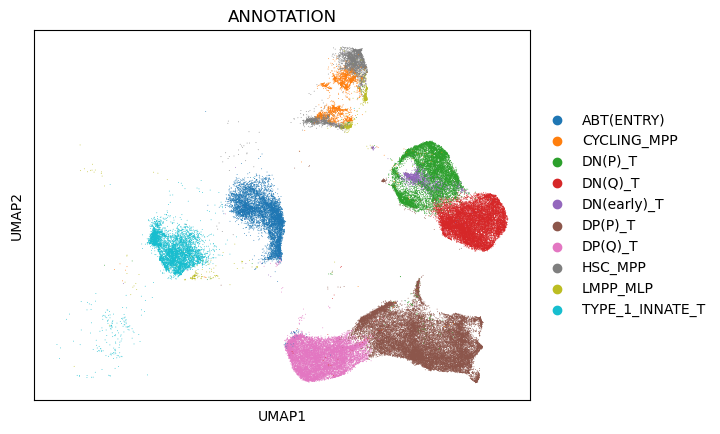

In [4]:
sc.pl.umap(adata_ref_SPT, color = 'ANNOTATION')

/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


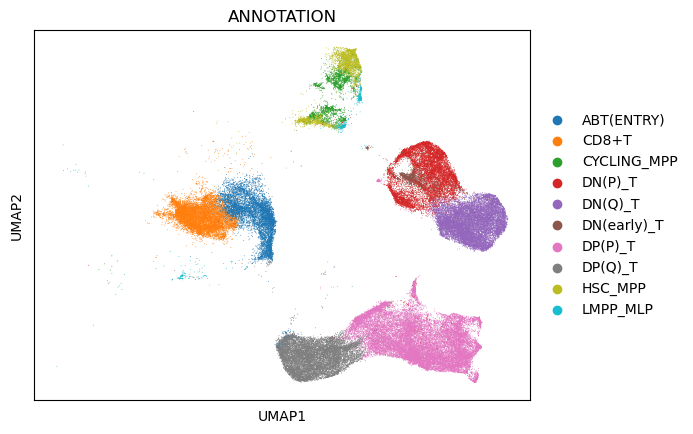

In [5]:
sc.pl.umap(adata_ref_CD8, color = 'ANNOTATION')

In [6]:
#adata_ref_SPT.write_h5ad('G2G_datasets/PanFetalReference/adata_ref_panfetal_SPTLineage_b4_preprocessing.h5ad')
#adata_ref_CD8.write_h5ad('G2G_datasets/PanFetalReference/adata_ref_panfetal_CD8Lineage_b4_preprocessing.h5ad')

In [2]:
adata_ref_SPT = anndata.read_h5ad('adata_ref_panfetal_SPTLineage_b4_preprocessing.h5ad')

In [3]:
adata_ref_SPT

AnnData object with n_obs × n_vars = 79535 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_colors', 'anno_lvl_2_LYMPHOID_colors', 'donor_colors', 'isin_HSC_IMMUNE_colors', 'isin_LYMPHOID_colors', 'isin_MEM_PROGENITORS_colors', 'isin_MYELOID_LYMPHOID_colors', 'isin_MYELOID_colors', 'isin_NKT_colors', 'isin_STROMA_colors', 'leiden', 'leiden_150_pred_label_expanded_colors', 'organ_colors', 'scvi', 'scvi_clusters_colors', 'umap', 'uniform_label_expanded_merged_propagated_colors'
    obsm: 'X_scvi', 'X_umap'
    

In [4]:
adata_ref_CD8 = anndata.read_h5ad('adata_ref_panfetal_CD8Lineage_b4_preprocessing.h5ad')

In [5]:
adata_ref_CD8

AnnData object with n_obs × n_vars = 83177 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_colors', 'anno_lvl_2_LYMPHOID_colors', 'donor_colors', 'isin_HSC_IMMUNE_colors', 'isin_LYMPHOID_colors', 'isin_MEM_PROGENITORS_colors', 'isin_MYELOID_LYMPHOID_colors', 'isin_MYELOID_colors', 'isin_NKT_colors', 'isin_STROMA_colors', 'leiden', 'leiden_150_pred_label_expanded_colors', 'organ_colors', 'scvi', 'scvi_clusters_colors', 'umap', 'uniform_label_expanded_merged_propagated_colors'
    obsm: 'X_scvi', 'X_umap'
    

In [7]:
# reference dataset stratified sampling from each cluster aiming 20000 cells in total - to get a reduced representation 
def reduce_dataset(adata, annotation_column_name):
    cluster_ids = np.unique(adata.obs[annotation_column_name])
    adata_merge = None
    n_processed_clusters = 0 
    n_cell_clusters = len(cluster_ids)

    TARGETTED_n_cells = 20000 # aiming for roughly this
    PERCENT_THRESHOLD = TARGETTED_n_cells*100/adata.shape[0] #PERCENT_THRESHOLD = 30
    print(PERCENT_THRESHOLD)
    MIN_SAMPLE_SIZE = 500
    assert(len(np.unique(adata.obs_names) ) == adata.shape[0]) # ensure we have unique cell ids

    for i in tqdm(range(n_cell_clusters)):
        cluster_id = cluster_ids[i]
        cluster_adata = adata[adata.obs[annotation_column_name] == cluster_id]
        cluster_cell_ids = cluster_adata.obs_names
        n_cluster_cells = len(cluster_cell_ids)
        #print(cluster_id)
        #print('# of cells:', n_cluster_cells)
        if(n_cluster_cells > MIN_SAMPLE_SIZE): # sample only if the cluster size exceeds min sample size
            sample_size = int(np.ceil(n_cluster_cells*PERCENT_THRESHOLD/100))
            #print('sample size: ', sample_size)
            if(sample_size<MIN_SAMPLE_SIZE): # if the sample size becomes less than min sample size
                #print('Change to min sample size ', MIN_SAMPLE_SIZE)
                sample_size = MIN_SAMPLE_SIZE
            samples = np.random.choice(np.arange(n_cluster_cells), sample_size,replace =False) # simple uniform random sampling of cells
            if(n_processed_clusters==0):
                adata_merge = adata[cluster_cell_ids[samples]] 
            else:
                adata_merge = adata_merge.concatenate(adata[cluster_cell_ids[samples]], index_unique = None )
        else:
            #print('NO SAMPLING')
            if(n_processed_clusters==0):
                adata_merge = cluster_adata 
            else:
                adata_merge = adata_merge.concatenate(cluster_adata, index_unique = None )

        n_processed_clusters = n_processed_clusters + 1
    return adata_merge

adata_ref_SPT = reduce_dataset(adata_ref_SPT, 'ANNOTATION')
adata_ref_CD8 = reduce_dataset(adata_ref_CD8, 'ANNOTATION')

25.146162067014522


100%|██████████| 10/10 [00:03<00:00,  2.90it/s]


24.04510862377821


100%|██████████| 10/10 [00:03<00:00,  2.99it/s]


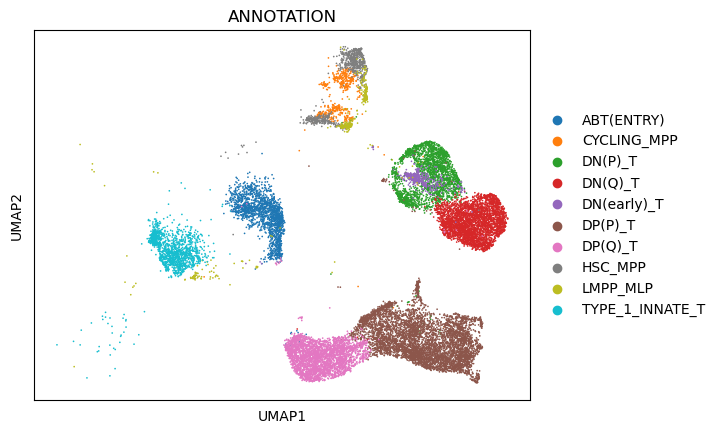

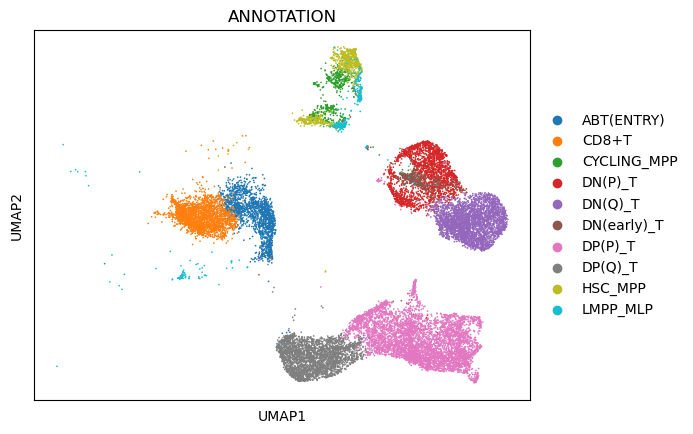

In [9]:
sc.pl.umap(adata_ref_SPT, color = 'ANNOTATION')
sc.pl.umap(adata_ref_CD8, color = 'ANNOTATION')

In [10]:
#adata_ref_SPT.write_h5ad('G2G_datasets/PanFetalReference/adata_ref_panfetal_SPTLineage_reduced_b4_preprocessing.h5ad')
#adata_ref_CD8.write_h5ad('G2G_datasets/PanFetalReference/adata_ref_panfetal_CD8Lineage_reduced_b4_preprocessing.h5ad')

In [11]:
adata_ref_SPT

AnnData object with n_obs × n_vars = 20384 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_colors'
    obsm: 'X_scvi', 'X_umap'
    layers: 'counts'

In [12]:
adata_ref_CD8

AnnData object with n_obs × n_vars = 20412 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_colors'
    obsm: 'X_scvi', 'X_umap'
    layers: 'counts'

In [37]:
adata_ato = anndata.read_h5ad('ATO.h5ad')

In [45]:
adata_ato

AnnData object with n_obs × n_vars = 31483 × 33538
    obs: 'sanger_sample_id', 'percent_total_human_UMI', 'percent_total_mito_UMI', 'human_cells', 'total_UMI_count_across_genes', 'n_genes_expressed', 'souporcell_doublet_prediction', 'souporcell_doublet_logprob', 'batch', 'sample', 'time_id', 'scrublet_doublet_scores', 'scrublet_predicted_doublets', 'new_annotation'
    var: 'mt'

In [41]:
np.unique(adata_ato.obs.batch)

array(['0', '1'], dtype=object)

In [1]:
#np.unique(adata_ato.obs.sample)

In [5]:
# Loading ATO dataset
adata_ato = anndata.read_h5ad('ATO.h5ad')
# ATO data lineage selection 
atoTlineage = ['ABT(ENTRY)', 'DN(EARLY)_T', 'DN_T', 'DP(P)_T', 
                     'DP(Q)_T','ENDOTHELIUM', 'HSC_MPP', 'HSC_MPP/LMPP_MLP/DC2', 'IPSC','MESODERMAL_PROGENITOR', 'PRIMITIVE_STREAK', 'SP_T' ]
condition_ato = [x in atoTlineage for x in adata_ato.obs.new_annotation]
adata_ato = adata_ato[condition_ato]
adata_ato.obs['bbk']= adata_ato.obs.batch

for x in [ 'percent_total_human_UMI', 'percent_total_mito_UMI','human_cells', 'total_UMI_count_across_genes', 'n_genes_expressed','souporcell_doublet_prediction', 'souporcell_doublet_logprob','sample', 'scrublet_doublet_scores','scrublet_predicted_doublets']:
    del adata_ato.obs[x]
    
adata_ato.layers['counts'] = adata_ato.X

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  


In [6]:
adata_ato

AnnData object with n_obs × n_vars = 19013 × 33538
    obs: 'sanger_sample_id', 'batch', 'time_id', 'new_annotation', 'bbk'
    var: 'mt'
    layers: 'counts'

In [7]:
# Capture time recording 
adata = adata_ato
adata.obs['ATO_days'] = np.repeat(0,adata.shape[0])
time_m = {'TO1 D-7':-7.0, 'TO1 D-14':-14.0,'T03 GEX':7,'T04 GEX':20.0, 'T05 GEX':37.0, 'T06 GEX':50,'T09_Kolf_Fiaj__G':-7.0,'T10_Kolf_Fiaj__G':0 }

for i in range(0,adata.shape[0]):
        adata.obs['ATO_days'][i] = time_m[adata.obs['time_id'][i]]
adata_ato = adata

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [8]:
print(np.unique(adata_ato.obs.ATO_days)) 

[-14  -7   0   7  20  37  50]


In [31]:
df = pd.DataFrame([np.asarray(adata_ato[adata_ato.obs.new_annotation == 'DN_T'].obs.ATO_days), np.repeat('DN_T', adata_ato[adata_ato.obs.new_annotation == 'DN_T'].shape[0])]) .transpose()

In [39]:
dfs = []
for CTYPE in ['DN_T', 'DN(EARLY)_T','DP(Q)_T','DP(P)_T']:

    df = pd.DataFrame([np.asarray(adata_ato[adata_ato.obs.new_annotation == CTYPE].obs.ATO_days), 
                   np.repeat(CTYPE, adata_ato[adata_ato.obs.new_annotation == CTYPE].shape[0])]) .transpose()
    df.columns = ['ATO_days','Cell_type']
    dfs.append(df)

In [46]:
df = dfs[0]
for i in range(1,len(dfs)):
    df = df.append(dfs[i])     

In [2]:
#sb.histplot(df, x='ATO_days',hue='Cell_type', multiple="dodge", bins=10) 

In [3]:
#sb.kdeplot(df, x='ATO_days', hue='Cell_type') 

In [58]:
np.mean(df[df['Cell_type']=='DN(EARLY)_T'].ATO_days) 

7.893350062735257

In [59]:
np.mean(df[df['Cell_type']=='DN_T'].ATO_days) 

27.458236658932716

In [60]:
np.mean(df[df['Cell_type']=='DP(Q)_T'].ATO_days) 

37.48523206751055

In [61]:
np.mean(df[df['Cell_type']=='DP(P)_T'].ATO_days) 

34.30500582072177

In [19]:
print(np.unique(adata_ato.obs.ATO_days)) 
adata_ato.write_h5ad('adata_ATO_SPT.h5ad')

[-14  -7   0   7  20  37  50]


### MERGE

In [1]:
import scanpy as sc
import scvi 
import anndata
import matplotlib.pyplot as plt
import numpy as np 
import torch
import pandas as pd
import seaborn as sb
import scanpy.external as sce
from tqdm import tqdm

torch.cuda.is_available() 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#scvi.settings.seed = <>

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
scvi.__version__

Global seed set to 0


'0.14.5'

In [2]:
adata_ref = anndata.read_h5ad('adata_ref_panfetal_SPTLineage_reduced_b4_preprocessing.h5ad')
adata_ref.X = adata_ref.layers['counts']
adata_ref.obs['ATO_days'] = np.repeat(10000,adata_ref.shape[0])
adata_ref.obs['ID'] = np.repeat('Reference', adata_ref.shape[0])

adata_ato = anndata.read_h5ad('adata_ATO_SPT.h5ad')
adata_ato.obs['ID'] = np.repeat('Organoid',adata_ato.shape[0])

In [3]:
print(adata_ref.X.data)
print(adata_ato.X.data)
print(adata_ref.shape) 
print(adata_ato.shape) 
print(np.unique(adata_ato.obs.new_annotation)) 
print(np.unique(adata_ref.obs.ANNOTATION)) 

[ 1.  1.  1. ...  5.  1. 13.]
[ 1.  1.  2. ... 16.  1. 84.]
(20384, 33538)
(19013, 33538)
['ABT(ENTRY)' 'DN(EARLY)_T' 'DN_T' 'DP(P)_T' 'DP(Q)_T' 'ENDOTHELIUM'
 'HSC_MPP' 'HSC_MPP/LMPP_MLP/DC2' 'IPSC' 'MESODERMAL_PROGENITOR'
 'PRIMITIVE_STREAK' 'SP_T']
['ABT(ENTRY)' 'CYCLING_MPP' 'DN(P)_T' 'DN(Q)_T' 'DN(early)_T' 'DP(P)_T'
 'DP(Q)_T' 'HSC_MPP' 'LMPP_MLP' 'TYPE_1_INNATE_T']


In [4]:
adata = adata_ref.concatenate(adata_ato, batch_key='ref',index_unique=None) 
del adata.obs['ref']

In [5]:
adata.obs.ID

FCAImmP7277556-TGATTTCGTTTCGCTC    Reference
FCAImmP7292034-ACTTACTAGTTGTCGT    Reference
FCAImmP7528283-TATCAGGAGCCATCGC    Reference
FCAImmP7277556-GAAACTCAGTGAACGC    Reference
FCAImmP7528294-CGAGAAGCATACCATG    Reference
                                     ...    
TTTGCGCTCCAGGGCT-1-7                Organoid
TTTGCGCTCGTAGATC-1-7                Organoid
TTTGGTTGTTGCGCAC-1-7                Organoid
TTTGGTTTCTACTCAT-1-7                Organoid
TTTGTCAAGCGTCAAG-1-7                Organoid
Name: ID, Length: 39397, dtype: object

In [1]:
#adata.write_h5ad('adata_refato_SPT_lineage_b4_reducerep_all_genes.h5ad')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


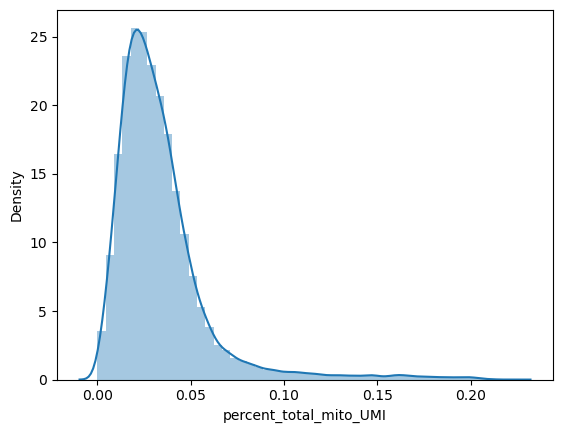

In [6]:
adata.raw = adata.copy() 

# remove cell cycle genes
cc_genes = pd.read_csv('regev_lab_cell_cycle_genes.txt', header=None ) # https://notebook.community/theislab/scanpy_usage/180209_cell_cycle/cell_cycle -- 97 CC GENES
#cc_genes = ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']
cc_genes = np.asarray(cc_genes[0]) 
#len(cc_genes)
relevent_cc_genes = [] 
for cc_gene in cc_genes:
    if(cc_gene in adata.var_names):
        relevent_cc_genes.append(cc_gene)
adata = adata[:,np.setdiff1d(adata.var_names,relevent_cc_genes)] 

#print(np.unique(adata.var_names.str.startswith('MT-'), return_counts=True)  )

mito_genes = adata.var_names.str.startswith('MT-') # 13 mito genes presents
total_UMI_count_across_mito_genes = np.sum(adata.X[:, mito_genes],axis=1).A1
total_UMI_count_across_genes = np.sum(adata.X,axis=1).A1 
adata.obs['percent_total_mito_UMI']= np.nan_to_num(np.divide(total_UMI_count_across_mito_genes,total_UMI_count_across_genes))
sb.distplot(adata.obs['percent_total_mito_UMI']) 

Q1,Q3 = np.percentile(adata.obs['percent_total_mito_UMI'],[25,75])
IQR = Q3-Q1
U = Q3 + (1.5*IQR)
#print(U*100)
adata = adata[adata.obs['percent_total_mito_UMI']<0.08] 
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_per_cell(adata, 10000) 
sc.pp.log1p(adata)

#print(np.unique(adata_ato.obs.new_annotation)) 
#print(np.unique(adata_ref.obs.ANNOTATION)) 

sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
#sc.pp.scale(adata,max_value=10)

In [7]:
print(len(np.unique(adata.obs['bbk'])))  # no of batches = 35
adata

35


View of AnnData object with n_obs × n_vars = 37503 × 2608
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch', 'ATO_days', 'ID', 'sanger_sample_id', 'time_id', 'new_annotation', 'percent_total_mito_UMI'
    var: 'GeneID-0', 'GeneName-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mt-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [8]:
adata[adata.obs.ID=='Reference']

View of AnnData object with n_obs × n_vars = 20327 × 2608
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch', 'ATO_days', 'ID', 'sanger_sample_id', 'time_id', 'new_annotation', 'percent_total_mito_UMI'
    var: 'GeneID-0', 'GeneName-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mt-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [9]:
adata[adata.obs.ID=='Organoid']

View of AnnData object with n_obs × n_vars = 17176 × 2608
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch', 'ATO_days', 'ID', 'sanger_sample_id', 'time_id', 'new_annotation', 'percent_total_mito_UMI'
    var: 'GeneID-0', 'GeneName-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mt-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [12]:
def run_scvi(adata):
    scvi.model.SCVI.setup_anndata(adata, batch_key="bbk", layer="counts")
    arches_params = dict(use_layer_norm="both",use_batch_norm="none", encode_covariates=True, dropout_rate=0.2, n_layers=2,)
    vae_ref = scvi.model.SCVI(adata, **arches_params)
    print(vae_ref)
    vae_ref.train()
    adata.obsm["X_scVI"] = vae_ref.get_latent_representation()
    sc.pp.neighbors(adata, use_rep="X_scVI")
    sc.tl.umap(adata)
    #sc.tl.leiden(adata, key_added='SCVI_leiden')
    return adata
adata = adata.copy()
adata = run_scvi(adata) 

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb, latent_distribution: normal
Training status: Not Trained

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 83/83: 100%|██████████| 83/83 [09:36<00:00,  6.94s/it, loss=763, v_num=1]


RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd

In [18]:
adata

AnnData object with n_obs × n_vars = 96485 × 2234
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'ATO_days', 'ID', 'sanger_sample_id', 'batch', 'time_id', 'new_annotation', 'percent_total_mito_UMI', '_scvi_batch', '_scvi_labels', 'ANNOTATION_COMB'
    var: 'GeneID-0', 'GeneName-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mt-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'ANNOTATION_colors', 'new_annotation_colors', 'ANNOTATION_COMB_colors', 'ID_colors'
    obsm: 'X_scVI', 'X_umap'
   

In [20]:
#adata.write_h5ad('adata_refato_SPT_lineage_b4_reducerep.h5ad')

In [4]:
#sc.set_figure_params(fontsize=4, dpi=200)
#sc.pl.umap(adata,color = ['ANNOTATION','new_annotation'],palette='tab20',legend_loc='on data')

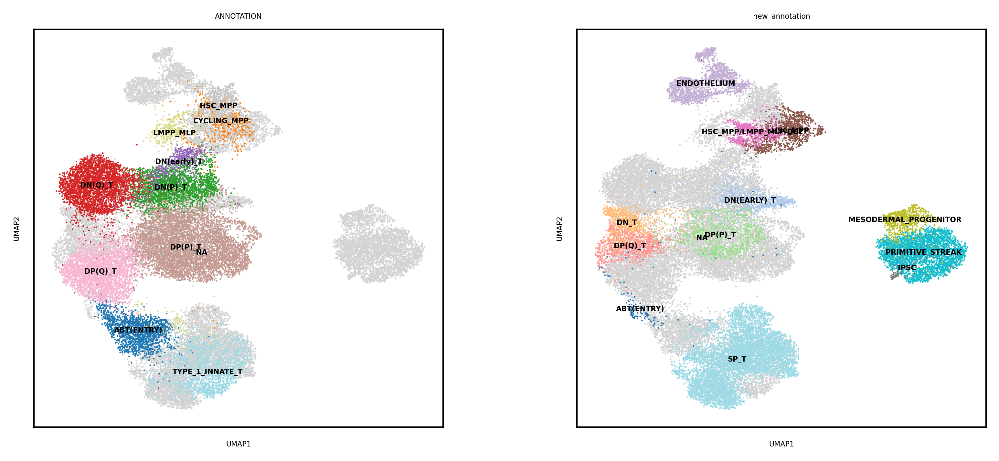

In [14]:
sc.set_figure_params(fontsize=4, dpi=200)
sc.pl.umap(adata,color = ['ANNOTATION','new_annotation'],palette='tab20',legend_loc='on data')

In [14]:
ann = [] 
for i in range(adata.shape[0]):
    if(adata.obs.ID[i]=='Organoid'):
        ann.append( adata.obs['new_annotation'][i])
    else:
        ann.append( adata.obs['ANNOTATION'][i])
adata.obs['ANNOTATION_COMB'] = ann

In [15]:
#sc.set_figure_params(fontsize=4, dpi=200)
#sc.pl.umap(adata,color = ['ANNOTATION','new_annotation'],palette='tab20',legend_loc='on data')

In [5]:
#sc.pl.umap(adata,color = ['ANNOTATION_COMB','ID'],palette='tab20',legend_loc='on data')

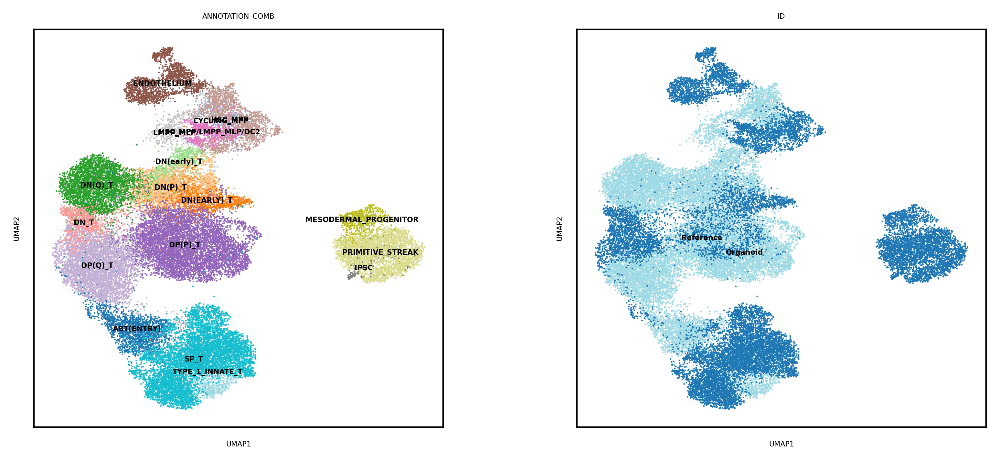

In [18]:
sc.pl.umap(adata,color = ['ANNOTATION_COMB','ID'],palette='tab20',legend_loc='on data')

In [19]:
import bbknn
from tqdm import tqdm
from scipy import stats as st
from scipy.special import softmax

adata_org= adata[adata.obs.ID=='Organoid']
adata_ref = adata[adata.obs.ID=='Reference']
params = {}
params['computation'] = 'cKDTree'
params['neighbors_within_batch'] = 3

nn_adata_org = adata_org#[[ x not in ['IPSC','ENDOTHELIUM','MESODERMAL_PROGENITOR','PRIMITIVE_STREAK' ] for x in adata_org.obs.ANNOTATION] ] 

ckd = bbknn.matrix.create_tree(nn_adata_org.obsm['X_umap'] , params)
knn_distances, knn_indices = bbknn.matrix.query_tree(adata[adata.obs.ID=='Reference'].obsm['X_umap'], ckd, params)
adata.obs['new_approx_time'] = np.repeat(0.0,adata.shape[0])
temp = []
for i in tqdm(range(len(knn_indices))):
   # if(adata.obs_names[i] not in s.obs_names):
   #     continue
    org_neighbours = nn_adata_org[knn_indices[i]]
    org_nn_ATO_days = np.asarray(org_neighbours.obs['ATO_days'])
    #sqrd = knn_distances[i]
    weights = softmax(knn_distances[i]) #sqrd /np.sum(sqrd) 
    temp = 1/weights # taking reciprocal as higher the distance we need smaller the weight
    weights = temp/np.sum(temp)
    approx_time = np.dot(weights,org_nn_ATO_days) 
    adata[adata_ref.obs_names[i]].obs['new_approx_time'][0] = approx_time

  0%|          | 0/20327 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
100%|██████████| 20327/20327 [07:18<00:00, 46.33it/s]


In [20]:
for i in range(adata.shape[0]):
    if(adata.obs.ID[i] == 'Organoid'):
        adata.obs['new_approx_time'][i] = adata.obs['ATO_days'][i] 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


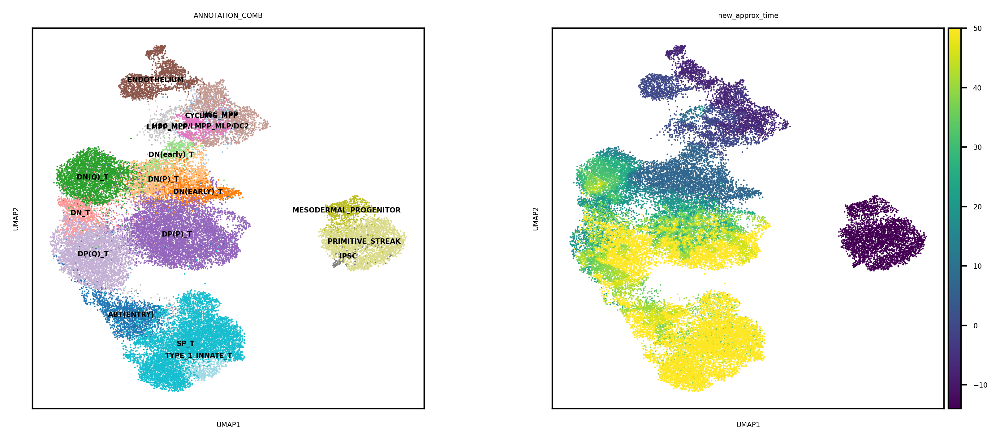

In [21]:
sc.pl.umap(adata,color = ['ANNOTATION_COMB','new_approx_time'],palette='tab20',legend_loc='on data')

In [22]:
ctype_prior_averages = {}
for ctype in np.unique(adata.obs.ANNOTATION_COMB):
    ctype_prior_averages[ctype] = np.mean(adata[adata.obs.ANNOTATION_COMB==ctype].obs.new_approx_time)

In [23]:
ctype_prior_averages

{'ABT(ENTRY)': 45.29165336435785,
 'CYCLING_MPP': -3.056282761085684,
 'DN(EARLY)_T': 7.893350062735257,
 'DN(P)_T': 8.630879640902265,
 'DN(Q)_T': 25.299553341417997,
 'DN(early)_T': 6.226028447411063,
 'DN_T': 27.374853113983548,
 'DP(P)_T': 38.37087662423417,
 'DP(Q)_T': 42.05553368332837,
 'ENDOTHELIUM': -3.5720338983050848,
 'HSC_MPP': -4.593224794751227,
 'HSC_MPP/LMPP_MLP/DC2': -3.5,
 'IPSC': -14.0,
 'LMPP_MLP': 12.4059022453631,
 'MESODERMAL_PROGENITOR': -14.0,
 'PRIMITIVE_STREAK': -13.995365772922874,
 'SP_T': 48.09438853308936,
 'TYPE_1_INNATE_T': 48.806480990846865}

In [26]:
# We refine approx time to ensure outliers due to noise in scvi embedding does not affect priors
adata.obs['refined_new_approx_time'] = np.repeat(0.0, adata.shape[0])
for i in range(adata.shape[0]):
    if(adata.obs.ID[i]=='Reference'):
        adata.obs['refined_new_approx_time'][i] = ctype_prior_averages[adata.obs.ANNOTATION_COMB[i]]
    else:
        adata.obs['refined_new_approx_time'][i] = adata.obs['new_approx_time'][i]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


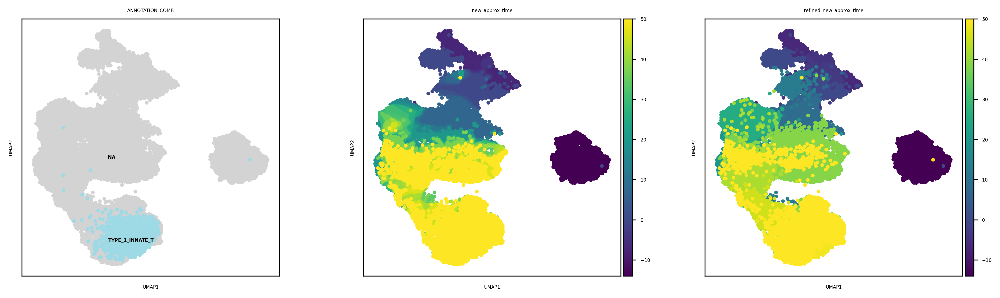

In [41]:
sc.pl.umap(adata,color = ['ANNOTATION_COMB','new_approx_time','refined_new_approx_time'],palette='tab20',legend_loc='on data',s=40, groups='TYPE_1_INNATE_T')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy o

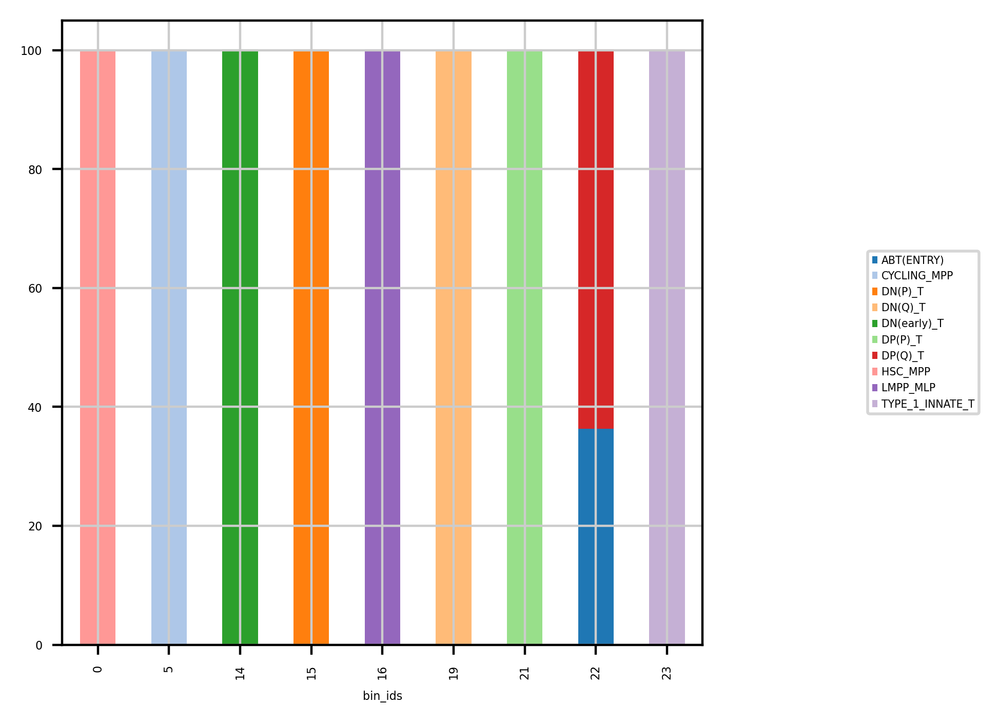

In [42]:
# Cell type composition plotter ---- an independent module ----
import pandas as pd
import matplotlib.pyplot as plt
from functools import cmp_to_key

def plot_celltype_composition_v1(adata_T, TIME_COLNAME):
    
    capture_time = torch.tensor(np.asarray(adata_T.obs[TIME_COLNAME]),dtype=torch.get_default_dtype() )
    capture_time = capture_time + (-1*(np.min(adata_T.obs[TIME_COLNAME]) - 1)) 
    time = capture_time.log2() / 6# we scale the time into the interval [0, 1]
    adata_T.obs['normalised_capture_time'] = time.numpy()

    bins = np.linspace(0,1,25)
    adata_T.obs['bin_ids'] = np.repeat(0,adata_T.shape[0])
    bin_id = 1
    for i in range(len(bins)):
        if(i+1==len(bins)):
            sub_adata=adata_T[list(adata_T.obs.normalised_capture_time >= bins[i]) ]
            adata_T.obs['bin_ids'][sub_adata.obs_names] = i 
            break
        sub_adata=adata_T[np.logical_and(list(adata_T.obs.normalised_capture_time >= bins[i]), list(adata_T.obs.normalised_capture_time < bins[i+1])) ]
        adata_T.obs['bin_ids'][sub_adata.obs_names] = i 
        
    plot_cell_type_proportions(adata_T, cell_type_colname='ANNOTATION_COMB',covariate_colname='bin_ids',sorter=None,color_scheme_name= "tab20")


def time_code_cmp(x,y):
    nx = re.split("[a-z]",x)[0]
    cx = x[len(x)-1]
    ny = re.split("[a-z]",y)[0]
    cy = y[len(y)-1]
    if(cx!=cy):
        if(cx=="w"):
            return -1
        elif(cx=="m" and cy=="y"):
            return -1
        else:
            return 1
    else:
        if(int(nx)< int(ny)):
            return -1
        else:
            return 1 
def sorter_help(col_as_series): # really unnecessary intermediate function to help panda take custom key sorter function (can't help as panda only takes a series)
    sorter = cmp_to_key(time_code_cmp)
    reorder = col_as_series.tolist()
    reorder.sort(key=sorter)
    return pd.Series(pd.Categorical(col_as_series, categories=reorder, ordered=True))

def plot_cell_type_proportions(adata, cell_type_colname, covariate_colname, sorter, color_scheme_name="Spectral"):
    meta1 = pd.DataFrame(np.vstack((adata.obs[cell_type_colname],adata.obs[covariate_colname])).transpose(),columns=[cell_type_colname,covariate_colname])
    meta1['COUNTER'] = 1
    meta1 = meta1.groupby([covariate_colname,cell_type_colname])['COUNTER'].sum().unstack()
    meta1 = meta1.fillna(0)
    meta1 = meta1.sort_values(by=covariate_colname, key=sorter)
    p = meta1.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True, color=sb.color_palette(color_scheme_name, 20))
    p.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
    

plot_celltype_composition_v1(adata[adata.obs.ID=='Reference'], TIME_COLNAME='refined_new_approx_time') #new_approx_time'

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  # This is added back by InteractiveShellApp.init_path()
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


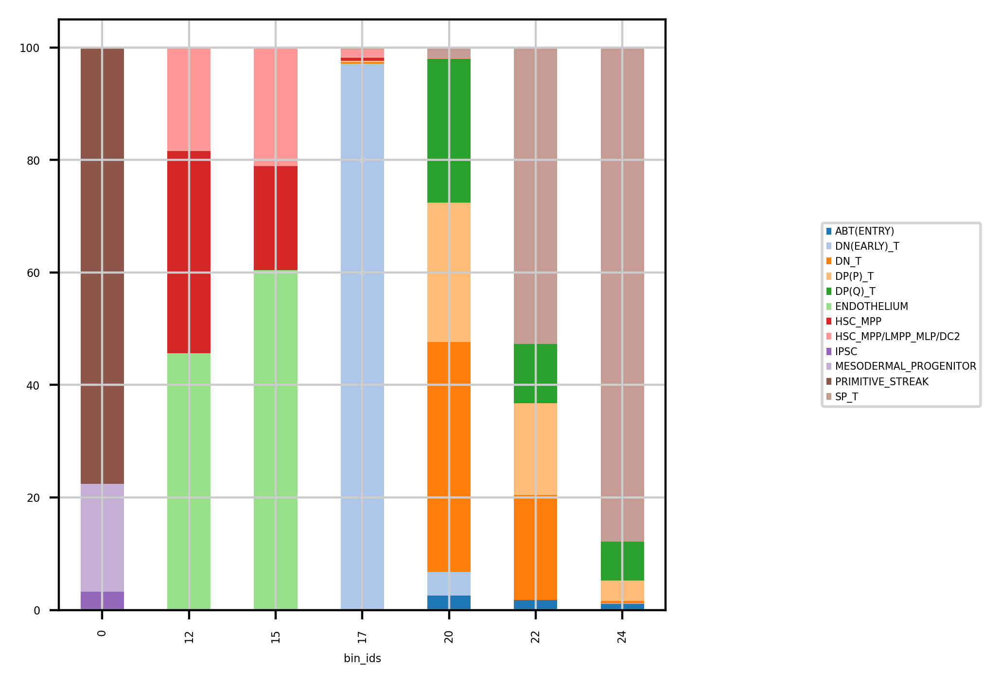

In [43]:
plot_celltype_composition_v1(adata[adata.obs.ID=='Organoid'], TIME_COLNAME='refined_new_approx_time')

In [46]:
adata.write_h5ad('G2G_datasets/RefATOIntegrated/adata_refato_SPT_lineage.h5ad')

In [47]:
#adata_org.write_h5ad('G2G_datasets/adata_org_SPT_29112022.h5ad')
#adata_ref.write_h5ad('G2G_datasets/adata_ref_SPT_29112022.h5ad')
adata_org = adata[adata.obs.ID=='Organoid']
adata_ref = adata[adata.obs.ID=='Reference']

adata_org.write_h5ad('adata_org_SPTLineage.h5ad')
adata_ref.write_h5ad('adata_ref_SPTLineage.h5ad')

### GPLVM RUN

In [15]:
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import numpy as np 
import torch
import pandas as pd
import seaborn as sb

torch.cuda.is_available() 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

from tqdm import tqdm
import pandas as pd
import torch
from torch.nn import Parameter
import pyro
import pyro.contrib.gp as gp
import pyro.distributions as dist
import pyro.ops.stats as stats

In [11]:
adata_ref = anndata.read_h5ad('adata_ref_SPTLineage.h5ad')
#adata = anndata.read_h5ad('adata_refato_SPT_lineage.h5ad') 

In [12]:
adata_T = adata_ref

In [29]:
np.unique(adata_T.obs.refined_new_approx_time)

array([-4.59322479, -3.05628276,  6.22602845,  8.63087964, 12.40590225,
       25.29955334, 38.37087662, 42.05553368, 45.29165336, 48.80648099])

In [19]:
adata = adata_T

In [ ]:
    pyro.set_rng_seed(1)
    time_prior_var_name='refined_new_approx_time'; n_latent_dim=2; num_steps=2000
    data = torch.tensor(adata.X.todense(), dtype=torch.get_default_dtype())
    #data = torch.tensor(adata_sars.X.todense(), dtype=torch.get_default_dtype())

    y = data.t()
    capture_time = torch.tensor(np.asarray(adata_T.obs[time_prior_var_name]),dtype=torch.get_default_dtype() )
    capture_time = capture_time + (-1*(np.min(adata_T.obs[time_prior_var_name]) - 1)) 
    #time = capture_time
    time = capture_time.log2() / 6# we scale the time into the interval [0, 1]
    #time = capture_time/np.sum(np.unique(capture_time)) 
    adata_T.obs['normalised_capture_time'] = time.numpy()

    # X Latent dimensions initialisation 
    X_prior_mean = torch.zeros(y.size(1), n_latent_dim)  # shape: cells x 2
    X_prior_mean[:, 0] = time

    kernel = gp.kernels.RBF(input_dim=n_latent_dim, lengthscale=torch.ones(n_latent_dim))

    # we clone here so that we don't change our prior during the course of training
    X = Parameter(X_prior_mean.clone())

    # SparseGPRegression model with num_inducing=32;
    # initial values for Xu are sampled randomly from X_prior_mean
    Xu = stats.resample(X_prior_mean.clone(), 32)
    noise_tensor = torch.tensor(0.01)
    gplvm = gp.models.SparseGPRegression(X, y, kernel, Xu, noise=noise_tensor, jitter=1e-4)
    gplvm.X = pyro.nn.PyroSample(dist.Normal(X_prior_mean, 0.1).to_event())
    gplvm.autoguide("X", dist.Normal)

In [26]:
X_prior_mean

tensor([[0.9449, 0.0000],
        [0.9449, 0.0000],
        [0.9449, 0.0000],
        ...,
        [0.9609, 0.0000],
        [0.9609, 0.0000],
        [0.9609, 0.0000]])

In [6]:
# source: https://pyro.ai/examples/gplvm.html 

def run_gplvm(adata, time_prior_var_name,n_latent_dim=2, num_steps = 1000):

    pyro.set_rng_seed(1)

    data = torch.tensor(adata.X.todense(), dtype=torch.get_default_dtype())
    #data = torch.tensor(adata_sars.X.todense(), dtype=torch.get_default_dtype())

    y = data.t()
    capture_time = torch.tensor(np.asarray(adata_T.obs[time_prior_var_name]),dtype=torch.get_default_dtype() )
    capture_time = capture_time + (-1*(np.min(adata_T.obs[time_prior_var_name]) - 1)) 
    #time = capture_time
    time = capture_time.log2() / 6# we scale the time into the interval [0, 1]
    #time = capture_time/np.sum(np.unique(capture_time)) 
    adata_T.obs['normalised_capture_time'] = time.numpy()

    # X Latent dimensions initialisation 
    X_prior_mean = torch.zeros(y.size(1), n_latent_dim)  # shape: cells x 2
    X_prior_mean[:, 0] = time

    kernel = gp.kernels.RBF(input_dim=n_latent_dim, lengthscale=torch.ones(n_latent_dim))

    # we clone here so that we don't change our prior during the course of training
    X = Parameter(X_prior_mean.clone())

    # SparseGPRegression model with num_inducing=32;
    # initial values for Xu are sampled randomly from X_prior_mean
    Xu = stats.resample(X_prior_mean.clone(), 32)
    noise_tensor = torch.tensor(0.01)
    gplvm = gp.models.SparseGPRegression(X, y, kernel, Xu, noise=noise_tensor, jitter=1e-4)
    gplvm.X = pyro.nn.PyroSample(dist.Normal(X_prior_mean, 0.1).to_event())
    gplvm.autoguide("X", dist.Normal)

    losses = gp.util.train(gplvm, num_steps=num_steps)

    # loss curve
    plt.plot(losses)
    plt.show()
    gplvm.mode = "guide"
    X = gplvm.X  # draw a sample from the guide of the variable X
    
    return X, gplvm, y

def plot_gplvm_embedding(adata, time_prior_var_name):
    adata.obs[time_prior_var_name] = np.asarray(adata.obs[time_prior_var_name], dtype=str)
    sc.set_figure_params(figsize=(6,6))
    sc.pl.embedding(adata, 'X_gplvm', color=[time_prior_var_name], size=90)
    

def estimate_pseudotime(adata):
    X, gplvm, y = run_gplvm(adata, time_prior_var_name=time_prior_var_name, n_latent_dim=1)
    X = torch.zeros(adata.shape[0], 2)  # shape: cells x 2
    X[:, 0] = gplvm.X.flatten()   
    adata.obsm['X_gplvm'] = X.detach().numpy() 
    plot_gplvm_embedding(adata,time_prior_var_name)
    adata.obs['time'] = np.asarray(pd.DataFrame(adata.obsm['X_gplvm'])[0] ) 
    return adata

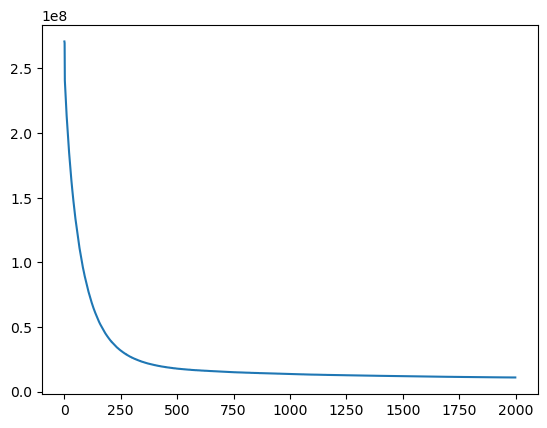

In [6]:
X, gplvm, y = run_gplvm(adata_T, time_prior_var_name='refined_new_approx_time', n_latent_dim=2, num_steps=2000)

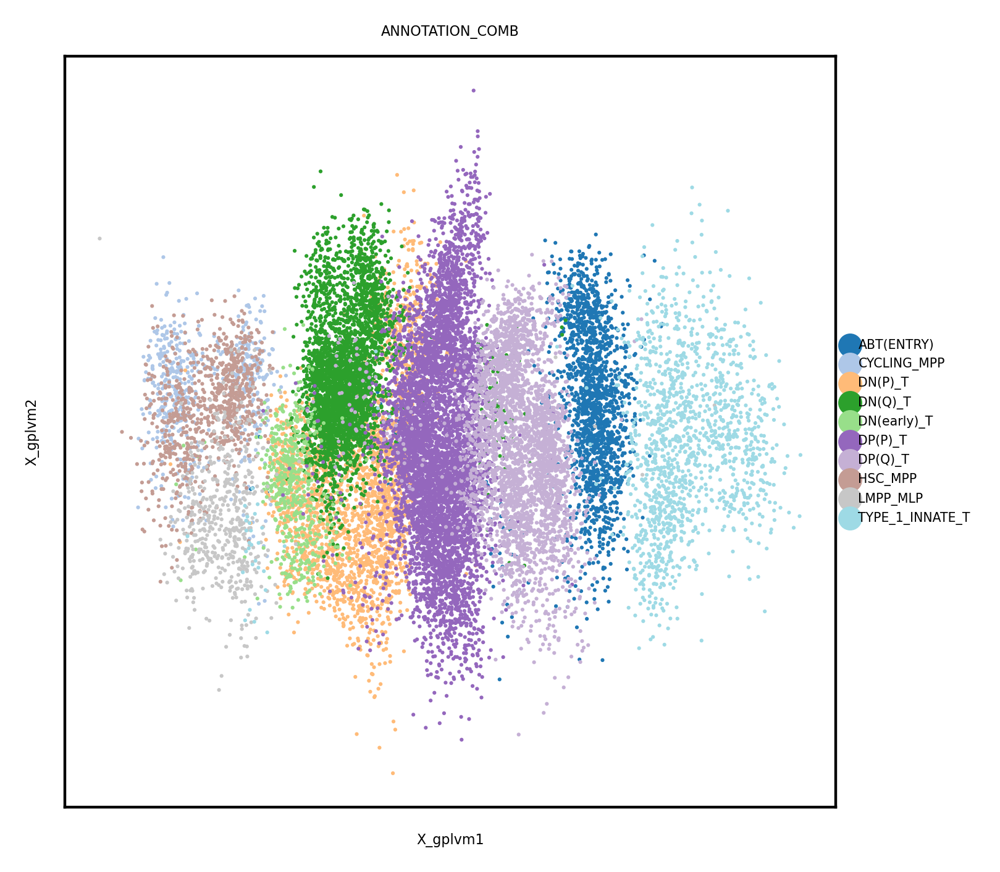

In [7]:
# with the refined new_approx_time
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

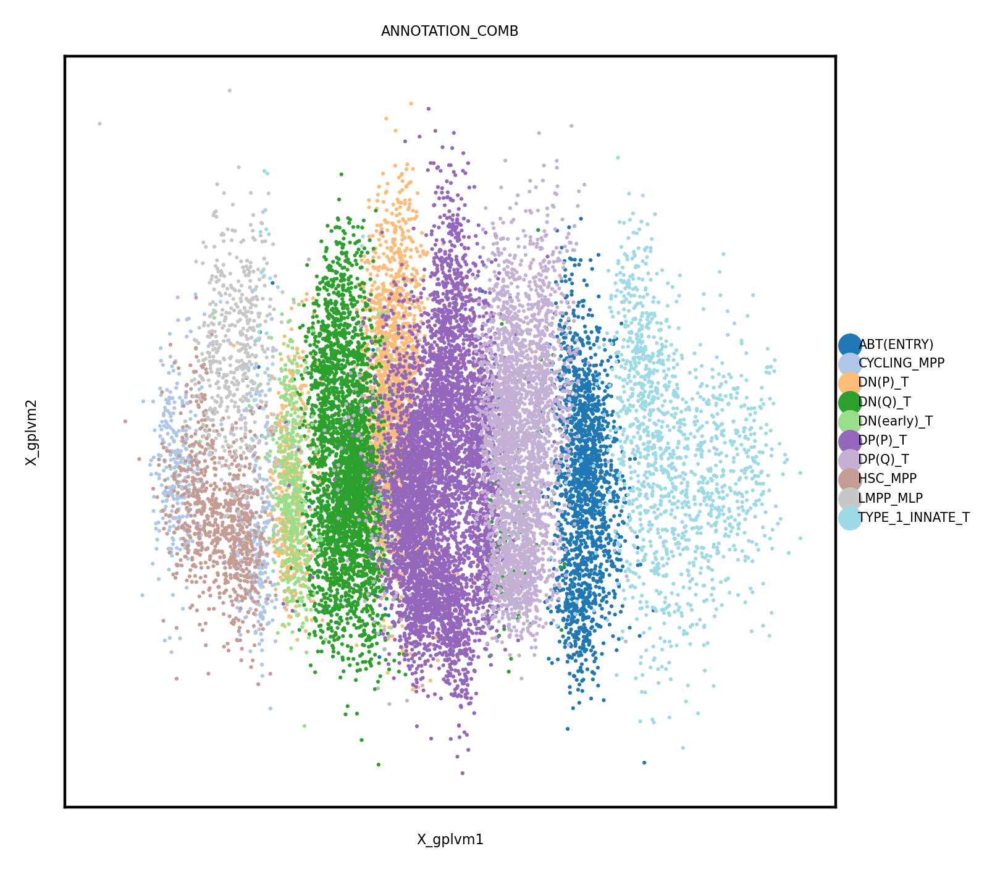

In [7]:
# with the refined new_approx_time
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

In [9]:
adata_T[adata_T.obs.ID=='Reference'].obsm['X_gplvm'] 

ArrayView([[ 1.8363166 ,  0.7116874 ],
           [ 1.7666707 ,  0.47714955],
           [ 1.7481818 ,  0.64522016],
           ...,
           [ 2.124947  ,  0.18940315],
           [ 2.0970097 ,  0.28913125],
           [ 2.5160255 , -0.35442334]], dtype=float32)

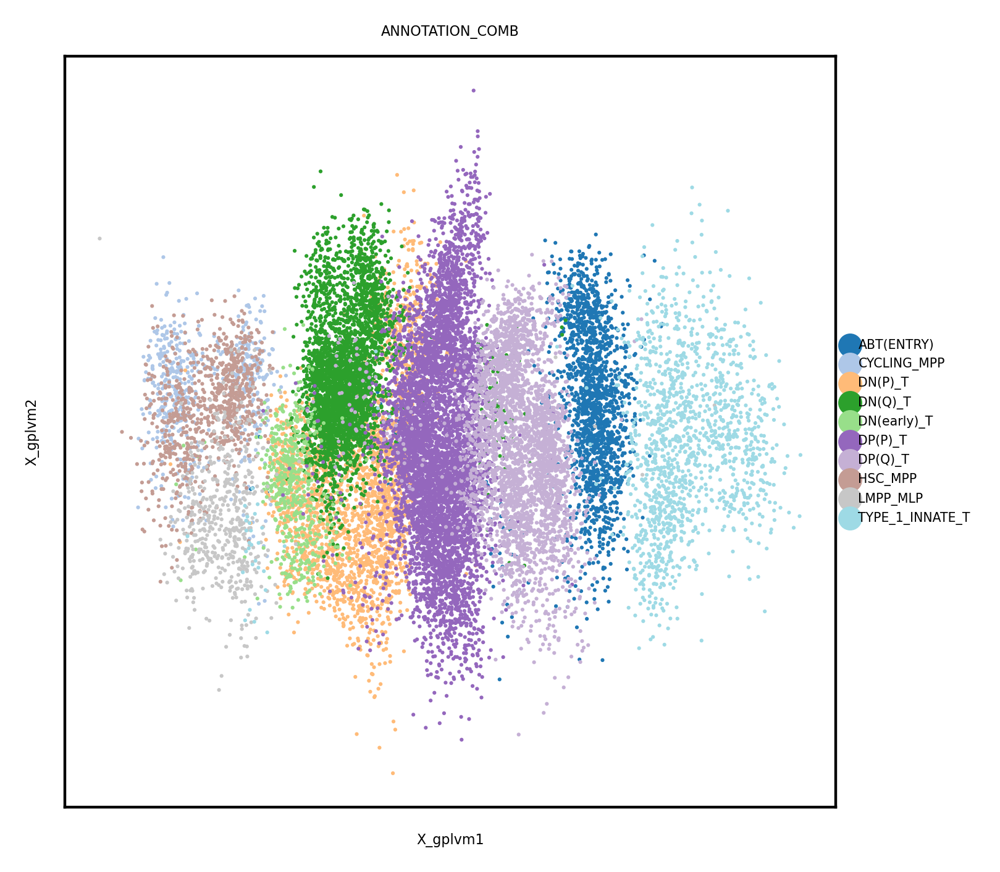

In [8]:
# with the refined new_approx_time
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

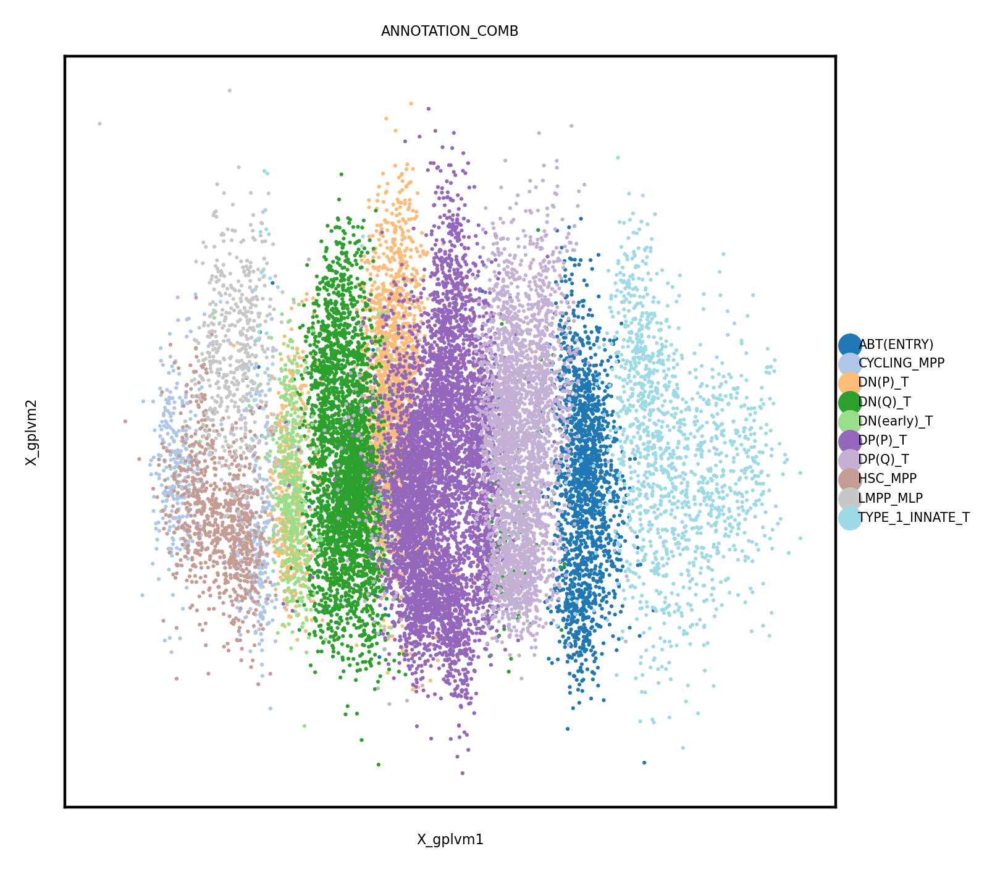

In [11]:
# with simply the new_approx_time
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

In [8]:
adata_T.obs['gplvm_pseudotime'] = X.detach().numpy()[:,0]

In [9]:
pd.DataFrame([adata_T.obs['gplvm_pseudotime'], adata_T.obs['ANNOTATION_COMB']] ).transpose().groupby('ANNOTATION_COMB').mean()

,gplvm_pseudotime
ANNOTATION_COMB,
ABT(ENTRY),1.680129
CYCLING_MPP,-0.390436
DN(P)_T,0.435791
DN(Q)_T,0.395389
DN(early)_T,0.094103
DP(P)_T,0.878762
DP(Q)_T,1.308672
HSC_MPP,-0.354728
LMPP_MLP,-0.268947


In [13]:
adata_T

AnnData object with n_obs × n_vars = 20327 × 2608
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'ANNOTATION', 'batch', 'ATO_days', 'ID', 'sanger_sample_id', 'time_id', 'new_annotation', 'percent_total_mito_UMI', '_scvi_batch', '_scvi_labels', 'ANNOTATION_COMB', 'new_approx_time', 'refined_new_approx_time', 'normalised_capture_time', 'gplvm_pseudotime'
    var: 'GeneID-0', 'GeneName-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mt-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_COMB_colors', 'ANNOTATION_colors', 'ID_colors', '_scvi_manager_uuid', '_scvi_uuid', 

In [17]:
np.unique(adata_T.obs['refined_new_approx_time']) 

array([-4.59322479, -3.05628276,  6.22602845,  8.63087964, 12.40590225,
       25.29955334, 38.37087662, 42.05553368, 45.29165336, 48.80648099])

In [23]:
#adata_T.write_h5ad('G2G_datasets/RefATOIntegrated/adata_ref_SPTLineage_gplvm.h5ad')

### Run GPLVM for organoid (restart the kernel due to cache issues in pyro)

In [1]:
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import numpy as np 
import torch
import pandas as pd
import seaborn as sb

torch.cuda.is_available() 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

from tqdm import tqdm
import pandas as pd
import torch
from torch.nn import Parameter
import pyro
import pyro.contrib.gp as gp
import pyro.distributions as dist
import pyro.ops.stats as stats

In [2]:
adata_org = anndata.read_h5ad('adata_org_SPTLineage.h5ad')
adata_T = adata_org

In [14]:
np.unique(adata_T[adata_T.obs.ANNOTATION_COMB=='DN_T'].obs['refined_new_approx_time'], return_counts=True) 

(array([ 7., 20., 37., 50.]), array([  2, 502, 316,  31]))

In [15]:
np.unique(adata_T[adata_T.obs.ANNOTATION_COMB=='DP(Q)_T'].obs['refined_new_approx_time'], return_counts=True) 

(array([20., 37., 50.]), array([314, 179, 442]))

In [16]:
np.unique(adata_T[adata_T.obs.ANNOTATION_COMB=='DP(P)_T'].obs['refined_new_approx_time'], return_counts=True) 

(array([ 7., 20., 37., 50.]), array([  2, 304, 278, 230]))

In [17]:
np.unique(adata_T[adata_T.obs.ANNOTATION_COMB=='DN(EARLY)_T'].obs['refined_new_approx_time'], return_counts=True) 

(array([ 0.,  7., 20., 50.]), array([  1, 743,  52,   1]))

There are  

502 DN_T cells captured on D20 
316 DN_T cells captured on D37

D37, 316 DN_T cells captured compared to 278 DP(P) cells and 179 DP(Q)_T cells



In [4]:
def run_gplvm(adata, time_prior_var_name,n_latent_dim=2, num_steps = 1000):

    pyro.set_rng_seed(1)

    data = torch.tensor(adata.X.todense(), dtype=torch.get_default_dtype())
    #data = torch.tensor(adata_sars.X.todense(), dtype=torch.get_default_dtype())

    y = data.t()
    capture_time = torch.tensor(np.asarray(adata_T.obs[time_prior_var_name]),dtype=torch.get_default_dtype() )
    capture_time = capture_time + (-1*(np.min(adata_T.obs[time_prior_var_name]) - 1)) 
    #time = capture_time
    time = capture_time.log2() / 6# we scale the time into the interval [0, 1]
    #time = capture_time/np.sum(np.unique(capture_time)) 
    adata_T.obs['normalised_capture_time'] = time.numpy()

    # X Latent dimensions initialisation 
    X_prior_mean = torch.zeros(y.size(1), n_latent_dim)  # shape: cells x 2
    X_prior_mean[:, 0] = time

    kernel = gp.kernels.RBF(input_dim=n_latent_dim, lengthscale=torch.ones(n_latent_dim))

    # we clone here so that we don't change our prior during the course of training
    X = Parameter(X_prior_mean.clone())

    # SparseGPRegression model with num_inducing=32;
    # initial values for Xu are sampled randomly from X_prior_mean
    Xu = stats.resample(X_prior_mean.clone(), 32)
    noise_tensor = torch.tensor(0.01)
    gplvm = gp.models.SparseGPRegression(X, y, kernel, Xu, noise=noise_tensor, jitter=1e-4)
    gplvm.X = pyro.nn.PyroSample(dist.Normal(X_prior_mean, 0.1).to_event())
    gplvm.autoguide("X", dist.Normal)

    losses = gp.util.train(gplvm, num_steps=num_steps)

    # loss curve
    plt.plot(losses)
    plt.show()
    gplvm.mode = "guide"
    X = gplvm.X  # draw a sample from the guide of the variable X
    
    return X, gplvm, y

def plot_gplvm_embedding(adata, time_prior_var_name):
    adata.obs[time_prior_var_name] = np.asarray(adata.obs[time_prior_var_name], dtype=str)
    sc.set_figure_params(figsize=(6,6))
    sc.pl.embedding(adata, 'X_gplvm', color=[time_prior_var_name], size=90)
    

def estimate_pseudotime(adata):
    X, gplvm, y = run_gplvm(adata, time_prior_var_name=time_prior_var_name, n_latent_dim=1)
    X = torch.zeros(adata.shape[0], 2)  # shape: cells x 2
    X[:, 0] = gplvm.X.flatten()   
    adata.obsm['X_gplvm'] = X.detach().numpy() 
    plot_gplvm_embedding(adata,time_prior_var_name)
    adata.obs['time'] = np.asarray(pd.DataFrame(adata.obsm['X_gplvm'])[0] ) 
    return adata

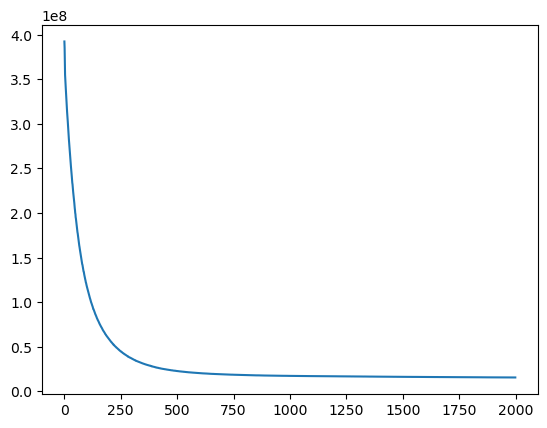

In [5]:
X, gplvm, y = run_gplvm(adata_T, time_prior_var_name='refined_new_approx_time', n_latent_dim=2, num_steps=2000)

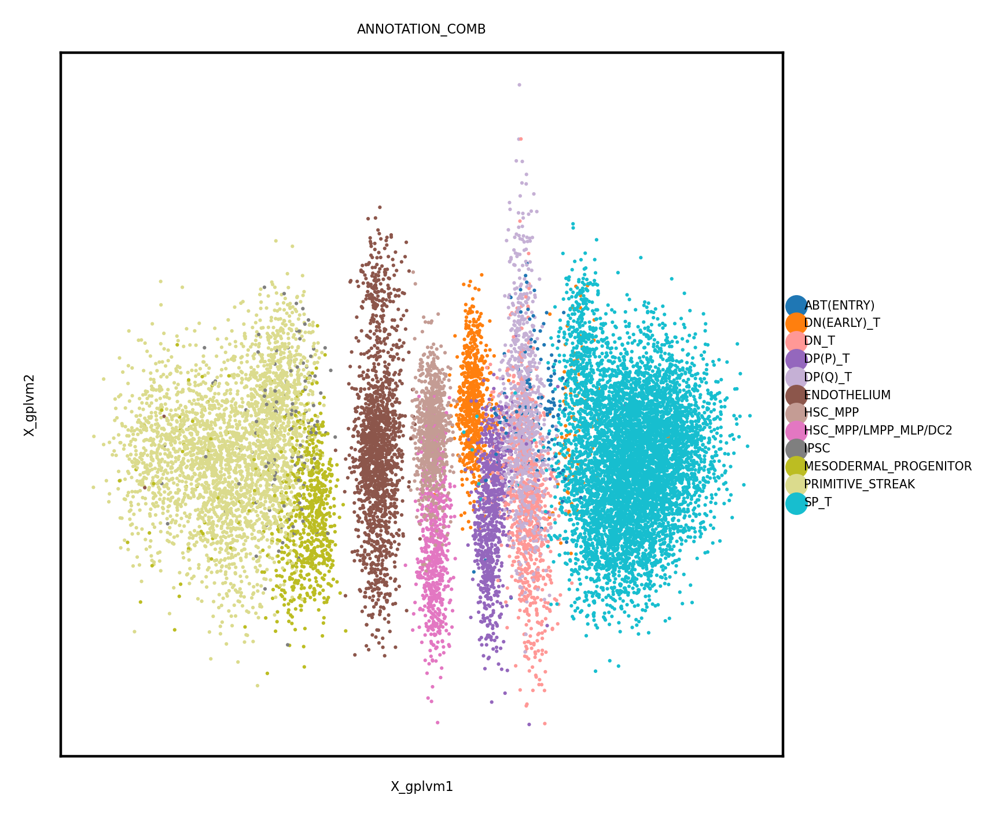

In [6]:
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

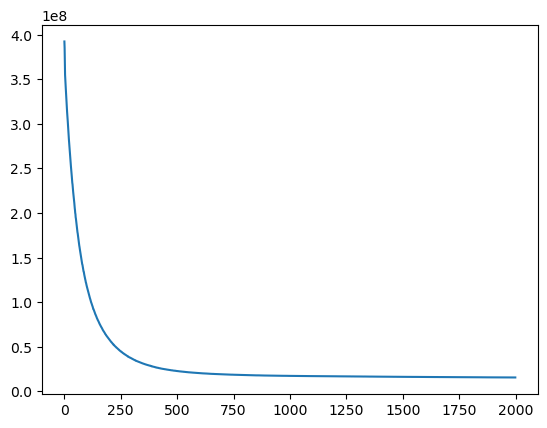

In [10]:
X, gplvm, y = run_gplvm(adata_T, time_prior_var_name='refined_new_approx_time', n_latent_dim=2, num_steps=2000)

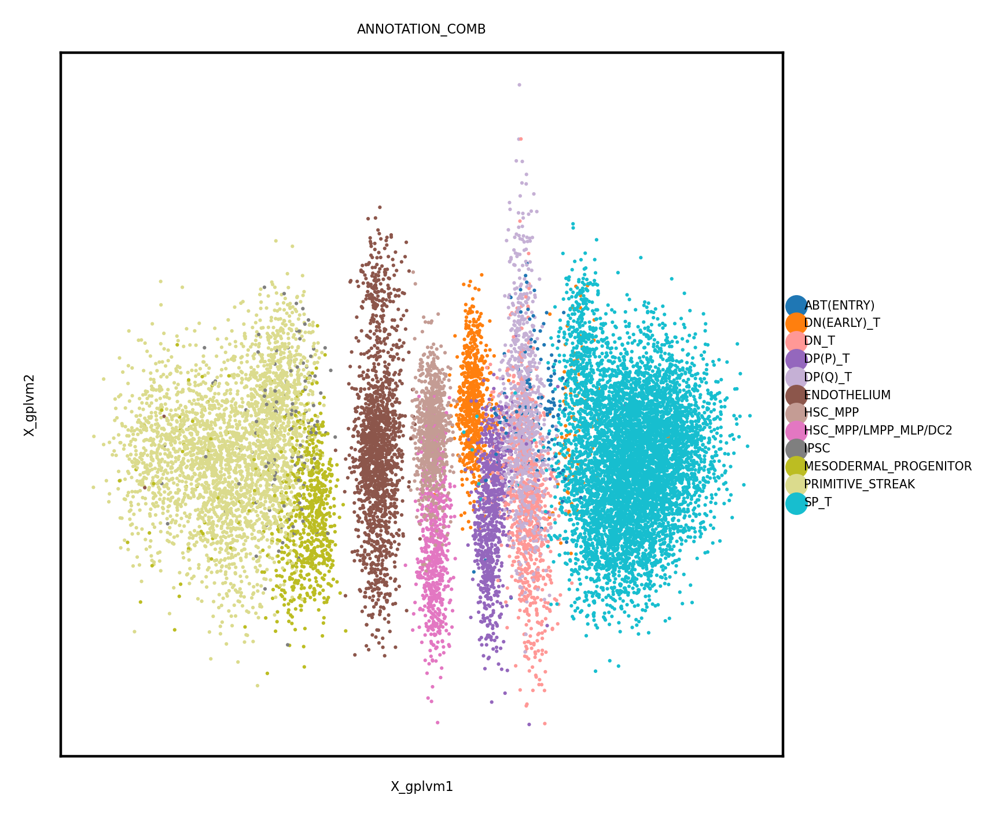

In [11]:
sc.set_figure_params(fontsize=4, dpi=200)
adata_T.obsm['X_gplvm'] = X.detach().numpy() 
sc.pl.embedding(adata_T, 'X_gplvm', color=['ANNOTATION_COMB'], size=5)

In [12]:
adata_T.obs['gplvm_pseudotime'] = X.detach().numpy()[:,0]

In [13]:
pd.DataFrame([adata_T.obs['gplvm_pseudotime'], adata_T.obs['ANNOTATION_COMB']] ).transpose().groupby('ANNOTATION_COMB').mean()

,gplvm_pseudotime
ANNOTATION_COMB,
ABT(ENTRY),1.084759
DN(EARLY)_T,0.735535
DN_T,1.010776
DP(P)_T,0.773726
DP(Q)_T,0.986656
ENDOTHELIUM,-0.014518
HSC_MPP,0.362570
HSC_MPP/LMPP_MLP/DC2,0.377866
IPSC,-0.667344


In [14]:
adata_T.write_h5ad('G2G_datasets/RefATOIntegrated/adata_org_SPTLineage_gplvm.h5ad')